# Analyze Open Diabetes Data

### Monitoring lab values related to diabetes is an important area for people who are at risk for diabetes. Over 37 million Americans have diabetes (about 1 in 10), and approximately 90-95% of them have type 2 diabetes (CDC website, accessed Jan 10, 2023). Type 2 diabetes most often develops in people over age 45, but more and more children, teens, and young adults are also developing it (CDC website, accessed Jan 10, 2023).
### One important lab for monitoring for diabetes is A1C result, which measures the amount of hemoglobin bound to glucose and reflects average blood glucose levels over the past 3 months. The A1C test result is reported as a percentage. The higher the A1C percentage is, the higher the blood glucose levels are. A normal A1C level is below 5.7 percent. For diabetics, however, the American Diabetes Association recommends ensuring A1C result values are less than 7%. (CDC website, accessed Jan 10, 2023).

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.api.types import CategoricalDtype
import seaborn as sns
!pip install plotly
!pip install cufflinks

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
sns.set()

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/niteen11/DataAnalyticsAcademy/master/Python/dataset_diabetes/diabetic_data.csv', index_col=0)

In [ ]:
df.shape

(101766, 49)

In [ ]:
df.head(10)

,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,?,?,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,?,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,?,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,?,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,?,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,?,?,31,6,16,0,0,0,414,411,250,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,>30
55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,?,?,70,1,21,0,0,0,414,411,V45,7,None,None,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,?,?,73,0,12,0,0,0,428,492,250,8,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,?,?,68,2,28,0,0,0,398,427,38,8,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
df.tail()
#head and tail show ? as missing data

,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,MC,?,51,0,16,0,0,0,250.13,291,458,9,None,>8,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,>30
443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,MC,?,33,3,18,0,0,1,560,276,787,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,MC,?,53,0,9,1,0,0,38,590,296,13,None,None,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Down,No,No,No,No,No,Ch,Yes,NO
443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,MC,Surgery-General,45,2,21,0,0,1,996,285,998,9,None,None,No,No,No,No,No,No,Steady,No,No,Steady,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
443867222,175429310,Caucasian,Male,[70-80),?,1,1,7,6,?,?,13,3,3,0,0,0,530,530,787,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 2278392 to 443867222
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   patient_nbr               101766 non-null  int64 
 1   race                      101766 non-null  object
 2   gender                    101766 non-null  object
 3   age                       101766 non-null  object
 4   weight                    101766 non-null  object
 5   admission_type_id         101766 non-null  int64 
 6   discharge_disposition_id  101766 non-null  int64 
 7   admission_source_id       101766 non-null  int64 
 8   time_in_hospital          101766 non-null  int64 
 9   payer_code                101766 non-null  object
 10  medical_specialty         101766 non-null  object
 11  num_lab_procedures        101766 non-null  int64 
 12  num_procedures            101766 non-null  int64 
 13  num_medications           101766 non-null  int64 


In [ ]:
#One possible assumption in this dataset on diabetes is that many patients have diabetes.
#To truly confirm if diabetes, consider adding a brand new column for future database from medical history, confirming a medical diagnsosis of diabetes and what kind of diabetes (type 1, or type 2)
# In protocols, the disease needs to be diagnosed by a qualified physician to be eligible for a diabetes related treatment.  
# If a patient is pre-diabetic or has a high risk for diabetes, then the diagnsois needs to state this, as the patient may be taking diabetes medications for this reason.
# Also, if a patient is a healthy normal patient, then the diagnosis section should state that instead.

In [ ]:
df.duplicated(keep=False)
#remove duplicates

encounter_id
2278392      False
149190       False
64410        False
500364       False
16680        False
35754        False
55842        False
63768        False
12522        False
15738        False
28236        False
36900        False
40926        False
42570        False
62256        False
73578        False
77076        False
84222        False
89682        False
148530       False
150006       False
150048       False
182796       False
183930       False
216156       False
221634       False
236316       False
248916       False
250872       False
252822       False
253380       False
253722       False
260166       False
293058       False
293118       False
325848       False
325866       False
326028       False
358776       False
377268       False
383430       False
419304       False
421194       False
449142       False
450210       False
464994       False
486156       False
498030       False
537834       False
544194       False
550098       False
584136       False

In [ ]:
# Count duplicate on a column
df.patient_nbr.duplicated().sum()

30248

In [ ]:
df.describe()
#the data are very wide ranging based on the mean, min, max values

,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [ ]:
df.dtypes

patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide       

In [ ]:
A1Ccounts = df.groupby(['A1Cresult'])['A1Cresult'].count()
A1Ccounts
#None values (84,748) are greatest. Most healthy people don't get A1C labs taken, indicating we likely have a very largely healthy pool. 
#As our focus is on diabetes, the >7 and >8 A1C results are important indicators for diabetes.  
#A1C results can also be calculated using maximum serum glucose.  
#To rule out this possibility that many None values may be due to max glu serum values, we need to see: Can the A1C results be calculated using max glucose serum values?

A1Cresult
>7       3812
>8       8216
None    84748
Norm     4990
Name: A1Cresult, dtype: int64

In [ ]:
max_glu_serum_counts = df.groupby(['max_glu_serum'])['max_glu_serum'].count()
max_glu_serum_counts
#No, A1C results cannot be calculated using maximum glucose serum in this dataset. None values are greater than A1C counts.  We will prioritize analysis of A1C results in this analysis.

max_glu_serum
>200     1485
>300     1264
None    96420
Norm     2597
Name: max_glu_serum, dtype: int64

In [ ]:
#The following are research questions based on the above initial inquiry:

### In the US, patients with diabetes or high risk tend to get treated, and manage their symptoms. This data analysis is only a check that patients with suspected diabetes are treated, for oversight purposes and ensure patient safety.  
###Have all patients with clinically significant A1C values indicating diabetes received any management of their symptoms, based on the data? If no management, is physician consultation recommended, for possible confirm of any diabetes and treatment?  Which patients are recommended for physician referral? (to Submit as a Dear Patient letter and or phone call.)  We need to prioritize this review for patient safety reasons.  

In [ ]:
missing_value = ['?']
#remove the missing value

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/niteen11/DataAnalyticsAcademy/master/Python/dataset_diabetes/diabetic_data.csv', na_values = missing_value, index_col=0)

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df.head()

,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,41,0,1,0,0,0,250.83,NaN,NaN,1,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,59,0,18,0,0,0,276,250.01,255,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,11,5,13,2,0,1,648,250,V27,6,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,NO
500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,44,1,16,0,0,0,8,250.43,403,7,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,NO
16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,51,0,8,0,0,0,197,157,250,5,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
df = df.dropna()
#drop all rows with NaN

In [ ]:
df.shape

(1043, 49)

In [ ]:
df.columns

Index(['patient_nbr', 'race', 'gender', 'age', 'weight', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'payer_code', 'medical_specialty', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:
#drop columns
df.drop('admission_type_id', axis = 1, inplace = True)
df.drop('discharge_disposition_id', axis = 1, inplace = True)
df.drop('admission_source_id', axis = 1, inplace = True)
df.drop('payer_code', axis = 1, inplace = True)
df.drop('medical_specialty', axis = 1, inplace = True)
df.drop('num_lab_procedures', axis = 1, inplace = True)
df.drop('num_procedures', axis = 1, inplace = True)
df.drop('num_medications', axis = 1, inplace = True)
df.drop('number_outpatient', axis = 1, inplace = True)
df.drop('number_emergency', axis = 1, inplace = True)
df.drop('number_inpatient', axis = 1, inplace = True)
df.drop('diag_1', axis = 1, inplace = True)
df.drop('diag_2', axis = 1, inplace = True)
df.drop('diag_3', axis = 1, inplace = True)

df

,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
88792836,100654011,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,<30
88986678,58682736,Caucasian,Male,[80-90),[50-75),6,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
89032962,69250302,Caucasian,Male,[60-70),[100-125),2,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89191392,62022042,Caucasian,Male,[40-50),[75-100),3,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89277516,30950811,Caucasian,Male,[50-60),[100-125),2,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89307582,58763808,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,<30
89343738,63813420,Caucasian,Male,[60-70),[50-75),3,9,None,None,No,No,No,No,No,No,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
89583948,84387969,Caucasian,Male,[50-60),[100-125),4,9,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89583978,110949741,Caucasian,Male,[70-80),[100-125),2,7,None,None,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30


In [ ]:
df.duplicated(keep=False)
# remove duplicates 

encounter_id
88792836     False
88986678     False
89032962     False
89191392     False
89277516     False
89307582     False
89343738     False
89583948     False
89583978     False
89727588     False
89776728     False
89986632     False
90093678     False
90136908     False
90234618     False
90409224     False
90443064     False
90710628     False
90739116     False
90832170     False
90850632     False
90863208     False
90884442     False
90962598     False
91048026     False
91108776     False
91153740     False
91188102     False
91234476     False
91237050     False
91244268     False
91255104     False
91345014     False
91421286     False
91985298     False
92065956     False
92068782     False
92140044     False
92221062     False
92264376     False
92321928     False
92442756     False
92489178     False
92605908     False
92610858     False
93029880     False
93134874     False
93155916     False
93211218     False
93272010     False
93314040     False
93426900     False

In [ ]:
df.patient_nbr.duplicated().sum()
#Count duplicate on a column

47

In [ ]:
df

,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
88792836,100654011,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,<30
88986678,58682736,Caucasian,Male,[80-90),[50-75),6,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
89032962,69250302,Caucasian,Male,[60-70),[100-125),2,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89191392,62022042,Caucasian,Male,[40-50),[75-100),3,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89277516,30950811,Caucasian,Male,[50-60),[100-125),2,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89307582,58763808,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,<30
89343738,63813420,Caucasian,Male,[60-70),[50-75),3,9,None,None,No,No,No,No,No,No,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
89583948,84387969,Caucasian,Male,[50-60),[100-125),4,9,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89583978,110949741,Caucasian,Male,[70-80),[100-125),2,7,None,None,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30


In [ ]:
df.index = pd.to_numeric(df.index, errors='coerce')
#add a regular index

In [ ]:
df.sort_index()

,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
88792836,100654011,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,<30
88986678,58682736,Caucasian,Male,[80-90),[50-75),6,9,None,None,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,Yes,NO
89032962,69250302,Caucasian,Male,[60-70),[100-125),2,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89191392,62022042,Caucasian,Male,[40-50),[75-100),3,9,None,None,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89277516,30950811,Caucasian,Male,[50-60),[100-125),2,7,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89307582,58763808,Caucasian,Female,[70-80),[75-100),10,9,None,None,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,<30
89343738,63813420,Caucasian,Male,[60-70),[50-75),3,9,None,None,No,No,No,No,No,No,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
89583948,84387969,Caucasian,Male,[50-60),[100-125),4,9,None,None,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
89583978,110949741,Caucasian,Male,[70-80),[100-125),2,7,None,None,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30


In [ ]:
df.dtypes

patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
time_in_hospital             int64
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide               object
glipizide                   object
glyburide                   object
tolbutamide                 object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol                    object
troglitazone                object
tolazamide                  object
examide                     object
citoglipton                 object
insulin                     object
glyburide-metformin         object
glipizide-metformin 

In [ ]:
df.groupby(['A1Cresult'])['patient_nbr'].count().sort_values(ascending=False)

A1Cresult
None    935
>8       57
>7       26
Norm     25
Name: patient_nbr, dtype: int64

In [ ]:
df.index

Int64Index([ 88792836,  88986678,  89032962,  89191392,  89277516,  89307582,
             89343738,  89583948,  89583978,  89727588,
            ...
            433101896, 433130288, 433719680, 434868986, 436191524, 436721264,
            437928656, 437959022, 439577312, 439606454],
           dtype='int64', name='encounter_id', length=1043)

In [ ]:
df.reset_index(inplace=True)
df = df.rename(columns = {'index':'Indexed_encounter_id'})

In [ ]:
df.dtypes
#now encounter_id index is in the dataframe

encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
time_in_hospital             int64
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide               object
glipizide                   object
glyburide                   object
tolbutamide                 object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol                    object
troglitazone                object
tolazamide                  object
examide                     object
citoglipton                 object
insulin                     object
glyburide-metformin 

In [ ]:
df.groupby(['A1Cresult'])['encounter_id'].count().sort_values(ascending=False)

A1Cresult
None    935
>8       57
>7       26
Norm     25
Name: encounter_id, dtype: int64

In [ ]:
df2 = df[(df['A1Cresult'] != 'None')]
#only actual results included. The None values will not appear.

In [ ]:
A1C_resultsyes = df2.groupby(['A1Cresult'])['A1Cresult'].count()
A1C_resultsyes

A1Cresult
>7      26
>8      57
Norm    25
Name: A1Cresult, dtype: int64

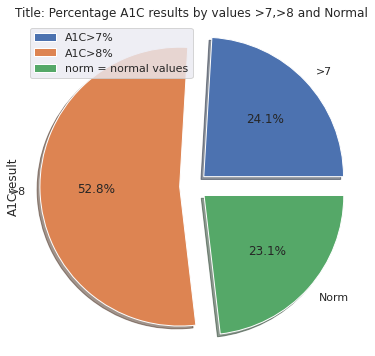

In [ ]:
#A1C results are graphed, indicating over half of actual A1C results are A1C >8 % (57, 52.8%), followed by A1C>7% (26, 24.1%), and Normal values (25, 23.1%).
#combining >8 and >7,  over 75% of actual A1C results are clinically significant.
A1C_resultsyes.plot.pie(figsize = (6, 6), shadow = True, explode = (0.1, 0.1, 0.1), autopct = '%1.1f%%')
labels = ['A1C>7%', 'A1C>8%', 'norm = normal values']
plt.title('Title: Percentage A1C results by values >7,>8 and Normal')
plt.legend(labels, loc = "best")
plt.axis('equal')

plt.show()

####over 75% of actual A1C results that are clinically significant.

### df code list
### df - A1C result is none, normal, >7, or >8
### df2 - A1C result is normal, >7, or >8
### df3 - A1C result is >7 or >8

In [ ]:
df3 = df2[(df2['A1Cresult'] != 'Norm')]
df3
#focus on >7% and >8% values only, which are the clinically significant A1C values according to the CDC and ADA research.
#there are 83 patients

,encounter_id,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
565,161410230,45004320,Caucasian,Female,[50-60),[50-75),3,9,None,>8,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,NO
571,162997158,110587005,Other,Male,[0-10),[0-25),4,3,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
584,165270666,76346199,Caucasian,Male,[60-70),[75-100),6,7,None,>7,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
587,166247610,110907864,Caucasian,Male,[30-40),[50-75),10,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
595,166784748,65011347,Caucasian,Male,[60-70),[125-150),8,9,None,>7,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
596,166898568,107235018,Caucasian,Male,[60-70),[50-75),3,9,None,>8,No,No,No,No,No,No,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
598,167360376,102491856,Caucasian,Female,[80-90),[50-75),2,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
600,167955030,49850208,AfricanAmerican,Male,[30-40),[125-150),2,6,None,>8,Steady,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
602,168258654,111481452,Caucasian,Female,[70-80),[50-75),4,8,None,>8,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
606,168409050,109214118,Caucasian,Female,[60-70),[75-100),8,9,None,>8,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
A1C_thresholdvals = df3.groupby(['A1Cresult', 'gender'])['gender'].count()
A1C_thresholdvals
#The number of males and females is about the same, for patients with A1C >7 and >8 A1C results.

A1Cresult  gender
>7         Female    12
           Male      14
>8         Female    30
           Male      27
Name: gender, dtype: int64

In [ ]:
A1C_thresholdvals = df3.groupby(['A1Cresult', 'age'])['age'].count()
A1C_thresholdvals
#the age distribution trending for A1C results is expected based on known diabetes and aging research. With increasing A1C, the age range increases.  Older people get higher A1Cs.

A1Cresult  age     
>7         [30-40)      2
           [40-50)      3
           [50-60)      4
           [60-70)     10
           [70-80)      7
>8         [0-10)       1
           [20-30)      4
           [30-40)      4
           [40-50)      5
           [50-60)     15
           [60-70)     10
           [70-80)      7
           [80-90)      8
           [90-100)     3
Name: age, dtype: int64

In [ ]:
df3['age'].value_counts()
#totals are combined for patients with A1Cresult >7 and >8 
#there are no clinically significant A1C patients in the 10 to 20 range.  What is concerning is 1 child in the 0-10 year range.

[60-70)     20
[50-60)     19
[70-80)     14
[80-90)      8
[40-50)      8
[30-40)      6
[20-30)      4
[90-100)     3
[0-10)       1
Name: age, dtype: int64

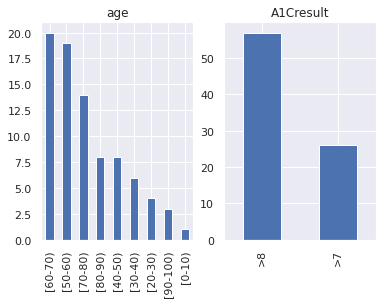

In [ ]:
categorical_features = ["age", "A1Cresult"]
fig, ax = plt.subplots(1, len(categorical_features))
for i, categorical_feature in enumerate(df3[categorical_features]):
    df3[categorical_feature].value_counts().plot(kind = "bar", ax=ax[i]).set_title(categorical_feature)
fig.show()
#The age groups with most clinically significant A1C values (A1C >7 or >8).  20 are [60-70) years age, 10 are [50-60) years age, then 14 are [70-80) years age groups.

In [ ]:
df3.describe()
# The maximum days for this subgroup in hospital is 14 days, and maximum number diagnoses is 9, suggesting need for management is critical to reducing further hospitalizations and disease progression.

,encounter_id,patient_nbr,time_in_hospital,number_diagnoses
count,8.300000e+01,8.300000e+01,83.000000,83.000000
mean,2.593809e+08,7.654217e+07,5.120482,8.168675
std,8.363129e+07,3.447691e+07,3.033945,1.429816
min,1.614102e+08,6.428826e+06,1.000000,3.000000
25%,1.873220e+08,5.831086e+07,3.000000,8.000000
50%,2.299112e+08,8.296723e+07,4.000000,9.000000
75%,3.048641e+08,1.027450e+08,7.000000,9.000000
max,4.331019e+08,1.824088e+08,14.000000,9.000000


In [ ]:
pd.set_option('display.max_columns', None)
#display all columns

In [ ]:
pd.set_option("max_rows", None)
#display all rows

In [ ]:
df3

,encounter_id,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
565,161410230,45004320,Caucasian,Female,[50-60),[50-75),3,9,None,>8,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,NO
571,162997158,110587005,Other,Male,[0-10),[0-25),4,3,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
584,165270666,76346199,Caucasian,Male,[60-70),[75-100),6,7,None,>7,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
587,166247610,110907864,Caucasian,Male,[30-40),[50-75),10,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Up,No,No,No,No,No,Ch,Yes,>30
595,166784748,65011347,Caucasian,Male,[60-70),[125-150),8,9,None,>7,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Yes,>30
596,166898568,107235018,Caucasian,Male,[60-70),[50-75),3,9,None,>8,No,No,No,No,No,No,Steady,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
598,167360376,102491856,Caucasian,Female,[80-90),[50-75),2,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
600,167955030,49850208,AfricanAmerican,Male,[30-40),[125-150),2,6,None,>8,Steady,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO
602,168258654,111481452,Caucasian,Female,[70-80),[50-75),4,8,None,>8,Steady,No,No,No,No,No,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Ch,Yes,>30
606,168409050,109214118,Caucasian,Female,[60-70),[75-100),8,9,None,>8,No,Steady,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
diabetesMed_counts = df3.groupby(['diabetesMed'])['diabetesMed'].count()
diabetesMed_counts
#that is good news.  Of the 83 patients with clinically significant A1C values, only 10 patients appear to have taken no diabetes medication.  let's confirm that.  If no meds, then recommend physician referral.
#Second, let's also confirm that of those "Yes" = diabetesMed, we actually have recorded medication of some kind. If no meds, then recommend contact physician for records to be transferred, and data uploaded into dataset.

diabetesMed
No     10
Yes    73
Name: diabetesMed, dtype: int64

In [ ]:
df4 = df3.loc[(df3['diabetesMed'] == 'No')]
df4

,encounter_id,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
571,162997158,110587005,Other,Male,[0-10),[0-25),4,3,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
598,167360376,102491856,Caucasian,Female,[80-90),[50-75),2,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
671,184058778,65349441,Caucasian,Female,[70-80),[50-75),3,6,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
704,192835434,62058582,Caucasian,Male,[50-60),[100-125),3,9,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
715,204459354,69172002,AfricanAmerican,Female,[40-50),[100-125),3,9,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
733,210628770,73122228,Caucasian,Male,[60-70),[100-125),10,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
780,227815044,60401475,Caucasian,Male,[60-70),[125-150),4,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
817,241498266,21148866,Caucasian,Male,[70-80),[100-125),2,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,<30
967,353773754,104956029,Caucasian,Male,[40-50),[75-100),4,7,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1021,419597300,82133919,Caucasian,Female,[60-70),[100-125),4,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO


In [ ]:
pd.set_option('display.max_columns', None)
#display all columns

In [ ]:
df4

,encounter_id,patient_nbr,race,gender,age,weight,time_in_hospital,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
571,162997158,110587005,Other,Male,[0-10),[0-25),4,3,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
598,167360376,102491856,Caucasian,Female,[80-90),[50-75),2,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
671,184058778,65349441,Caucasian,Female,[70-80),[50-75),3,6,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
704,192835434,62058582,Caucasian,Male,[50-60),[100-125),3,9,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
715,204459354,69172002,AfricanAmerican,Female,[40-50),[100-125),3,9,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,>30
733,210628770,73122228,Caucasian,Male,[60-70),[100-125),10,9,None,>8,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
780,227815044,60401475,Caucasian,Male,[60-70),[125-150),4,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
817,241498266,21148866,Caucasian,Male,[70-80),[100-125),2,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,<30
967,353773754,104956029,Caucasian,Male,[40-50),[75-100),4,7,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO
1021,419597300,82133919,Caucasian,Female,[60-70),[100-125),4,8,None,>7,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,No,NO


In [ ]:
df4.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'time_in_hospital', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:
df4[['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 
     'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone',
     'metformin-pioglitazone']].eq('Yes').all(1).sum()
#All the medication columns have data of Yes or No in them. Are there any columns with Yes?  
#The results are 0, meaning All columns are No.  That is, none of the 10 patients are taking medications for their diabetes which is exhibited via >7 >8 A1C results.

0

In [ ]:
#Of the 10 patients, which one needs to be contacted immediately and given a phone call, besides the pediatric patient?  
#The patient with time_in_hospital = 10 days has the greatest # days in hospital, with 9 diagnoses, and is in the upper end of weight.
#Patient_nbr 73122228 in row 733.

In [ ]:
patient_nbr_list = df4['patient_nbr'].tolist()
patient_nbr_list

[110587005,
 102491856,
 65349441,
 62058582,
 69172002,
 73122228,
 60401475,
 21148866,
 104956029,
 82133919]

### This request is based on a data analysis, and is only an internal check to confirm our records are current and accurate for oversight purposes, and to help ensure patient safety which is a priority for our organization.

###The data check answers the following questions: 
### -- Have all patients with clinically significant A1C values (A1C >7% or >8%) indicating diabetes received any management of their symptoms, based on the data?  Answer: 83 patients have clinically significant A1C values.  Of the 83, 73 pts appear to be managing their symptoms based on the data, which is good news.  Of the 83, 10 pts (10%) have symptoms but no management documented.
### -- If no management was noted in the data, is recommending physician consultation needed, for possible confirm of diabetes diagnosis and treatment? Answer: Yes, some recommendations are for physician referral on possible diabetes and treatment. (Please Submit as a Dear Patient letter and or phone call.) We are prioritizing this list for patient safety reasons.
####  Recommend physician referral contact for 10 patients.  Reconfirm A1C values for possible diabetes, recommend retest A1C to verify, and provide treatment options.
####  10 Patient numbers are: 
####  1. 110587005,  <--pediatric patient, priority to contact.
####  2. 73122228,  <--adult patient, priority to contact.
####  3. 102491856,
####  4.  65349441,
####  5.  62058582,
####  6.  69172002,
####  7.  60401475,
####  8.  21148866,
####  9. 104956029,
####  10. 82133919. 
#### Once contact has been made, patient consents to diagnosis, and diabetes and treatment are confirmed, please provide diabetes lab values and medication updates for database. Thank you.